In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/pima-indians-diabetes-database/diabetes.csv


Import all the necessary packages

In [41]:
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

import pickle


Import Diabetes Dataset

In [9]:
df=pd.read_csv(".\diabetes.csv")

In [10]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


array([[<AxesSubplot:title={'center':'Pregnancies'}>,
        <AxesSubplot:title={'center':'Glucose'}>,
        <AxesSubplot:title={'center':'BloodPressure'}>],
       [<AxesSubplot:title={'center':'SkinThickness'}>,
        <AxesSubplot:title={'center':'Insulin'}>,
        <AxesSubplot:title={'center':'BMI'}>],
       [<AxesSubplot:title={'center':'DiabetesPedigreeFunction'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Outcome'}>]], dtype=object)

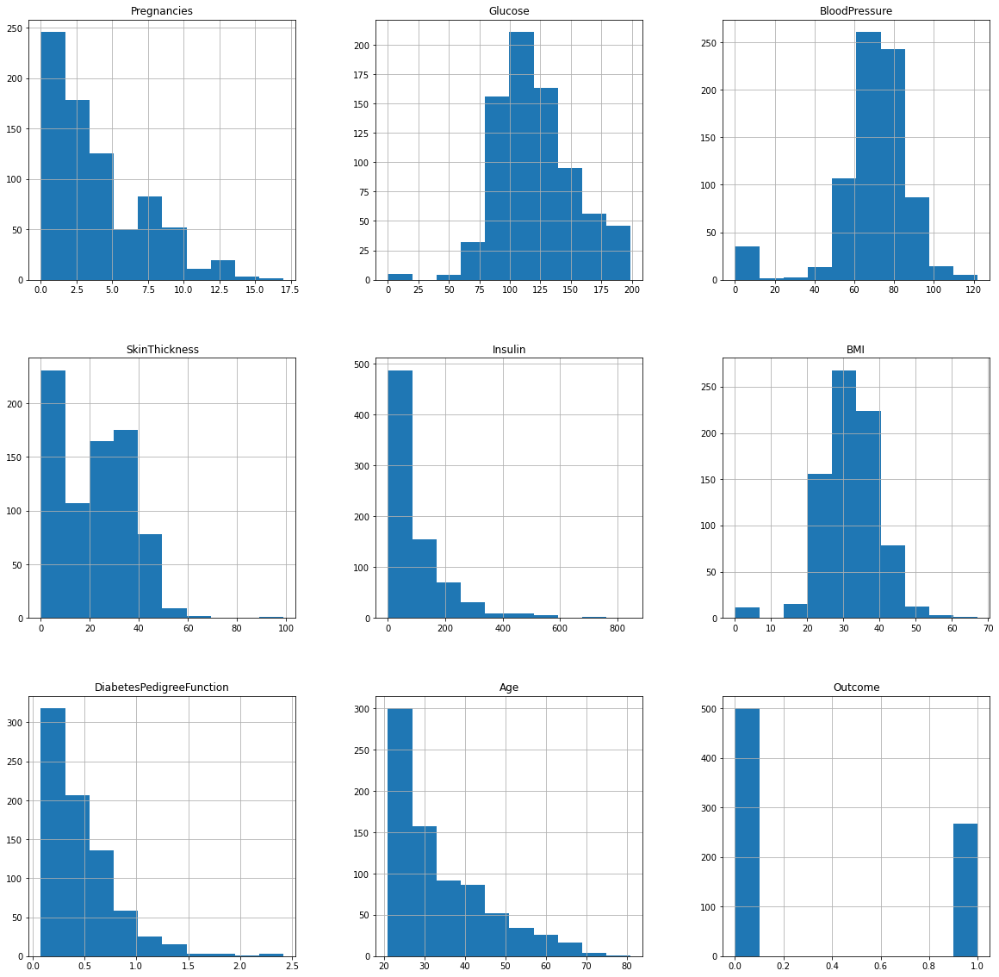

In [12]:
df.hist(figsize=(20,20))

In [13]:
dfBMI = df['BMI']

In [14]:
df_age = df['Age'] == 0

In [15]:
df_age.sum()

0

In [16]:
dfBMI.sort_values()

145     0.0
706     0.0
522     0.0
49      0.0
371     0.0
       ... 
120    53.2
125    55.0
673    57.3
445    59.4
177    67.1
Name: BMI, Length: 768, dtype: float64

In [17]:
df[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

In [18]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
import statistics

In [20]:
def Filler(col):
    Healthy = df
    Unhealthy = df
    
    Healthy = df.loc[((df[col].notnull()) & (df['Outcome'] == 0))]
    HealthyMedian = Healthy[col].median()
    Unhealthy = df.loc[((df[col].notnull()) & (df['Outcome'] == 1))]
    UnhealthyMedian = Unhealthy[col].median()
    
    df.loc[(df['Outcome'] == 0 ) & (df[col].isnull()), col] = HealthyMedian
    df.loc[(df['Outcome'] == 1 ) & (df[col].isnull()), col] = UnhealthyMedian
    
    

In [21]:
dfcopy = df

In [22]:
Filler('Glucose')
Filler('BloodPressure')
Filler('BMI')
Filler('Insulin')
Filler('SkinThickness')


In [23]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
lr = LinearRegression()
x = df.drop(['Outcome'],axis = 1)
y = df['Outcome']
x_train, x_test, y_train, y_test = train_test_split(x,y, random_state = 44, test_size=0.15)

In [25]:
lr.fit(x_train,y_train)
pred_1 = lr.predict(x_test)
score_1 = r2_score(y_test,pred_1)

In [26]:
score_1

0.4319051599657804

In [27]:
from sklearn import svm

In [28]:
clf_svm = svm.SVC(kernel='linear')
clf_svm.fit(x_train,y_train)
print(y_test)

452    0
370    1
746    1
122    0
614    1
      ..
0      1
297    0
555    0
303    1
185    1
Name: Outcome, Length: 116, dtype: int64


In [29]:
clf_svm.predict(x_test)

array([0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 1], dtype=int64)

In [30]:
clf_svm.score(x_test,y_test)

0.8017241379310345

In [31]:
from sklearn.tree import DecisionTreeClassifier as dtc

clf_dec = dtc()
clf_dec.fit(x_train,y_train)

DecisionTreeClassifier()

In [32]:
clf_dec.predict(x_test)

array([0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 1, 1, 1], dtype=int64)

In [33]:
clf_dec.score(x_test,y_test)

0.8793103448275862

In [34]:
from sklearn.naive_bayes import GaussianNB as gnb

clf_gnb = gnb()
clf_gnb.fit(x_train,y_train)
clf_gnb.score(x_test,y_test)

0.8017241379310345

In [35]:
from sklearn.linear_model import LogisticRegression as lor

In [36]:
clf_log = lor(solver='liblinear')

In [37]:
clf_log.fit(x_train,y_train)

LogisticRegression(solver='liblinear')

In [38]:
clf_log.score(x_test,y_test)

0.7931034482758621

In [39]:
from sklearn.metrics import f1_score

f1_score(y_test, clf_dec.predict(x_test), average = None)

array([0.9       , 0.84782609])

In [42]:
pickle.dump(clf_dec, open('model.pkl','wb'))

In [44]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.677083,72.389323,29.089844,141.753906,32.434635,0.471876,33.240885,0.348958
std,3.369578,30.464161,12.106039,8.890820,89.100847,6.880498,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.750000,64.000000,25.000000,102.500000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,28.000000,102.500000,32.050000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,169.500000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000
